In [149]:
import ee
import geopandas as gpd
import fiona
import matplotlib.pyplot as plt
import pandas as pd
import rasterio as rio
from rasterio.plot import show

from src.data import mtbs
from src.visualization import ee_viz
from src.data import gedi_loader
from src.data import fire_perimeters
from src.visualization.gedi_viz import geo_plot
from src.visualization import gedi_viz
from src.data.fire_perimeters import FirePerimeters, FirePerimetersDB, Fire, match_gedi_to_raster, FireRastersDB


import seaborn as sns
sns.set_theme()

import importlib
importlib.reload(mtbs)
importlib.reload(ee_viz)
importlib.reload(fire_perimeters)
importlib.reload(gedi_loader)
importlib.reload(gedi_viz)

<module 'src.visualization.gedi_viz' from '/home/jk871/fire-regen/src/visualization/gedi_viz.py'>

### Get Creek Fire Info

Creek fire is the second largest Sierra fire from the years 2020/2021, and we have GEDI data for both before and after the fire.

In [2]:
sierras = gpd.read_file("../../../data/shapefiles/sierras_convex_hull.shp")

firep_db = FirePerimetersDB('../../../data/fire_perimeters.gdb/')
sierra_firep = FirePerimeters(firep_db).filter_for_years(['2020', '2021']).filter_within_geometry(sierras)

creek = sierra_firep.get_fire('CREEK')

In [3]:
raster_file_path = "/maps/fire-regen/data/rasters/CREEK/"

In [4]:
raster_db = FireRastersDB(raster_file_path, 'creek')

## Visualize Location and Perimeter

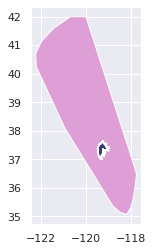

In [9]:
creek.overlay_fire_map(sierras)

In [10]:
creek.get().geometry.explore()

### Get fire GEDI shots and match them to NBR rasters

In [5]:
creek.load_gedi(load_buffer=True)

2023-05-06 11:15:10,585 INFO: Loading Level 4a GEDI shots for period 2019-2023 in this geometry [in get_gedi_shots at /home/jk871/fire-regen/src/data/gedi_loader.py:20]
2023-05-06 11:15:41,596 INFO: Number of GEDI shots found: 110015 [in get_gedi_shots at /home/jk871/fire-regen/src/data/gedi_loader.py:58]
2023-05-06 11:15:41,650 INFO: Loading Level 4a GEDI shots for period 2019-2023 in this geometry [in get_gedi_shots at /home/jk871/fire-regen/src/data/gedi_loader.py:20]
2023-05-06 11:16:34,665 INFO: Number of GEDI shots found: 162130 [in get_gedi_shots at /home/jk871/fire-regen/src/data/gedi_loader.py:58]


### Get CREEK severity rasters

In [106]:
def before_fire(shots):
    return shots[shots.absolute_time < creek.alarm_date]

def after_fire(shots):
    return shots[shots.absolute_time > creek.cont_date]

def filter_trees(shots):
    return shots[shots.pft_class == 1]

In [6]:
gedi_dnbr6 = match_gedi_to_raster(creek.gedi, raster_db.get('dnbr6'), 3, ['severity'])
gedi_dnbr = match_gedi_to_raster(creek.gedi, raster_db.get('dnbr'), 3, ['severity'])
gedi_rdnbr = match_gedi_to_raster(creek.gedi, raster_db.get('rdnbr'), 3, ['severity'])

In [7]:
gedi_buffer_dnbr6 = match_gedi_to_raster(creek.gedi_buffer, raster_db.get('dnbr6'), 3, ['severity'])
gedi_buffer_dnbr = match_gedi_to_raster(creek.gedi_buffer, raster_db.get('dnbr'), 3, ['severity'])
gedi_buffer_rdnbr = match_gedi_to_raster(creek.gedi_buffer, raster_db.get('rdnbr'), 3, ['severity'])

<AxesSubplot: xlabel='severity_median', ylabel='Count'>

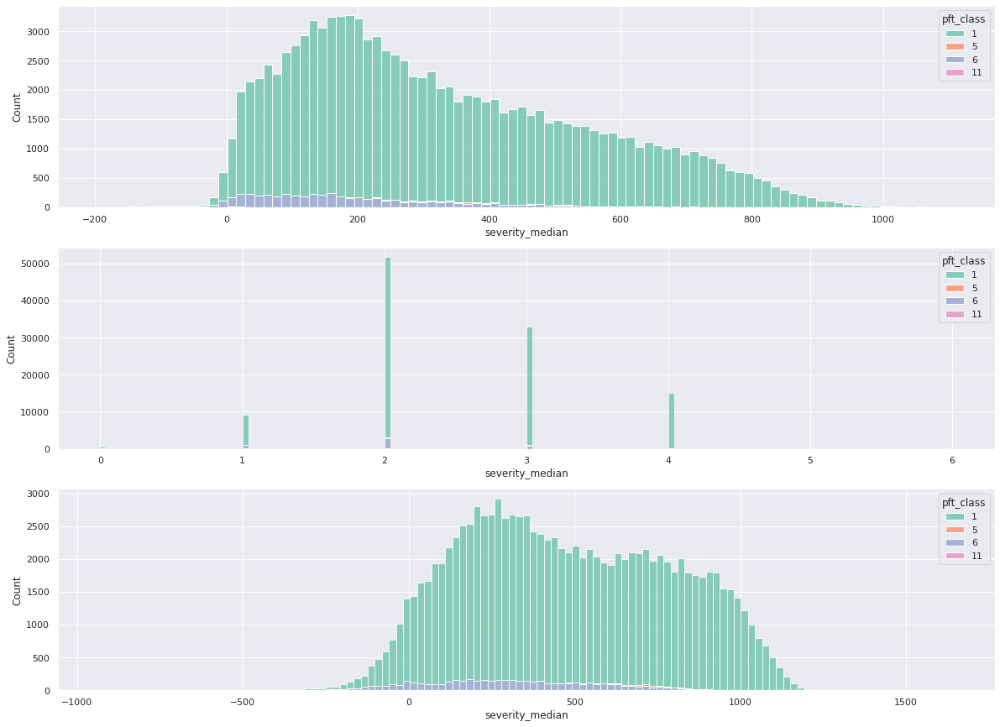

In [12]:
fig, ax = plt.subplots(3, 1, figsize=(20,15))
sns.histplot(gedi_dnbr, x='severity_median', ax=ax[0], hue='pft_class', multiple='stack', palette='Set2')
sns.histplot(gedi_dnbr6, x='severity_median', ax=ax[1], hue='pft_class', multiple='stack', palette='Set2')
sns.histplot(gedi_rdnbr, x='severity_median', ax=ax[2], hue='pft_class', multiple='stack', palette='Set2')

(0.0, 1000.0)

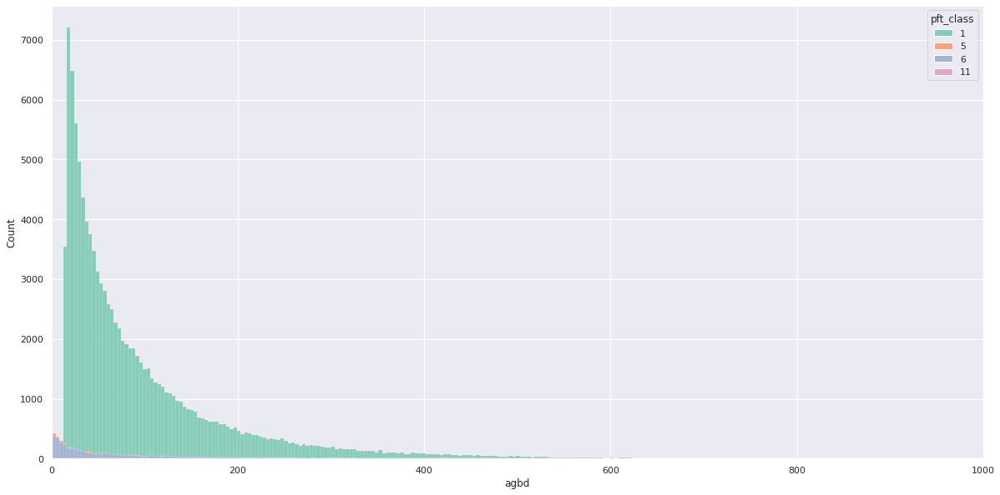

In [19]:
fig, ax = plt.subplots(1, 1, figsize=(20,10))
sns.histplot(gedi_dnbr, x='agbd', ax=ax, hue='pft_class', multiple='stack', palette='Set2')
ax.set_xlim((0, 1000))

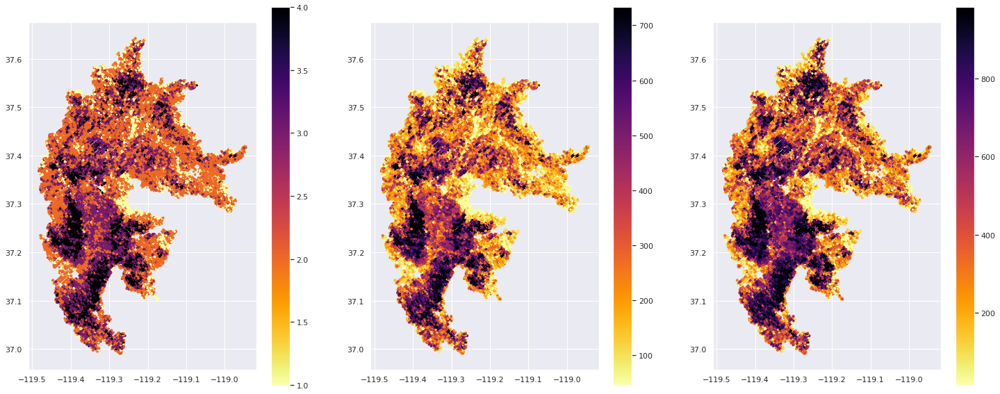

In [132]:
fig, ax = plt.subplots(1, 3, figsize=(25,10))

geo_plot(gedi_dnbr6, ax[0], 'severity_median')
geo_plot(gedi_dnbr, ax[1], 'severity_mean')
geo_plot(gedi_rdnbr, ax[2], 'severity_mean')

### Look at GEDI outliers - i.e. high values

In [91]:
gedi_dnbr[gedi_dnbr.agbd > 1000]

,shot_number,absolute_time,lon_lowestmode,lat_lowestmode,agbd,agbd_pi_lower,agbd_pi_upper,agbd_se,beam_type,sensitivity,pft_class,geometry,severity_3x3,severity_sample,severity_mean,severity_std,severity_median
12165,87140300200119742,2020-06-26 13:14:34.371534+01:00,-119.138257,37.541564,1050.158081,836.717712,1287.820190,4.381495,coverage,0.951421,6,POINT (-119.13826 37.54156),"[107, 396, 407, 94, 396, 433, 68, 312, 429]",396,293.555556,148.132907,396.0
12571,222621100300286209,2022-11-17 09:32:45.694144+00:00,-119.181710,37.527129,2341.169189,1949.939087,2768.142822,6.465720,full,0.975249,6,POINT (-119.18171 37.52713),"[0, 158, 313, 163, -13, 273, 166, 106, 98]",-13,140.444444,102.780360,158.0
26976,175890800200123658,2022-01-20 01:46:09.409000+00:00,-119.296725,37.256257,1509.045654,1110.326050,1968.814087,11.271598,full,0.985050,1,POINT (-119.29673 37.25626),"[421, 323, 319, 421, 323, 375, 367, 383, 366]",323,366.444444,37.007840,367.0
30647,21830200200229561,2019-05-02 11:57:51.793781+01:00,-119.329107,37.246484,1475.666504,1081.766968,1930.598877,11.268719,coverage,0.967763,1,POINT (-119.32911 37.24648),"[277, 197, 137, 168, 126, 206, 145, 229, 257]",126,193.555556,50.754553,197.0
43765,175891100200120018,2022-01-20 01:46:09.239588+00:00,-119.299293,37.247141,1313.136475,943.685669,1743.478638,11.242555,full,0.977031,1,POINT (-119.29929 37.24714),"[371, 349, 369, 440, 368, 447, 391, 399, 523]",368,406.333333,51.732216,391.0
58641,138880600300528397,2021-05-26 08:14:45.707926+01:00,-119.117106,37.543376,2191.876709,1702.715942,2742.720947,11.388708,full,0.964331,1,POINT (-119.11711 37.54338),"[146, 214, 313, 76, 0, 313, 67, 10, 143]",0,142.444444,111.180645,143.0
73189,87140500200119808,2020-06-26 13:14:34.991334+01:00,-119.117775,37.547275,1047.258057,720.004944,1435.638794,11.286198,full,0.980088,1,POINT (-119.11778 37.54728),"[108, 150, 48, 424, 58, 18, 289, 223, 55]",58,152.555556,127.692435,108.0
88382,87140300200119608,2020-06-26 13:14:33.264102+01:00,-119.203641,37.496661,1274.651001,1029.418091,1546.059692,4.734939,coverage,0.955434,6,POINT (-119.20364 37.49666),"[308, 539, 706, 166, 670, 560, 721, 711, 560]",670,549.000000,182.644159,560.0
105735,140101100300286998,2021-06-03 05:09:19.389124+01:00,-119.221711,37.446379,1277.323608,913.308899,1702.249634,11.246241,full,0.959217,1,POINT (-119.22171 37.44638),"[48, 50, 5, -13, -18, 5, 15, -29, 65]",-18,14.222222,31.300613,5.0
117790,87140800200123128,2020-06-26 13:14:32.970675+01:00,-119.245299,37.444168,1100.885986,765.639343,1496.839966,11.208571,full,0.962980,1,POINT (-119.24530 37.44417),"[-11, -6, -8, -7, -6, 8, -25, 5, 27]",-6,-2.555556,13.704104,-6.0


<AxesSubplot: >

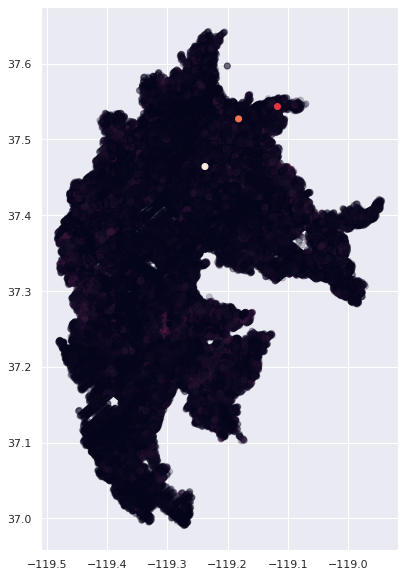

In [95]:
fig, ax = plt.subplots(1, 1, figsize=(15,10))

gedi_dnbr.plot(column='agbd', ax=ax, alpha=0.2)
gedi_dnbr[gedi_dnbr.agbd > 1500].plot(column='agbd', ax=ax)

### Look at GEDI before and after fire

In [30]:
print('AGBD before fire')
print(creek.get_gedi_before_fire().agbd.describe())

print('AGBD after fire')
print(creek.get_gedi_after_fire().agbd.describe())

AGBD before fire
count    42454.000000
mean       115.205988
std        106.792929
min          1.061925
25%         40.437689
50%         80.680099
75%        153.143761
max       1475.666504
Name: agbd, dtype: float64
AGBD after fire
count    67561.000000
mean        84.938165
std         93.600261
min          0.870713
25%         26.795208
50%         52.248116
75%        104.708260
max       2680.233887
Name: agbd, dtype: float64


(0.0, 700.0)

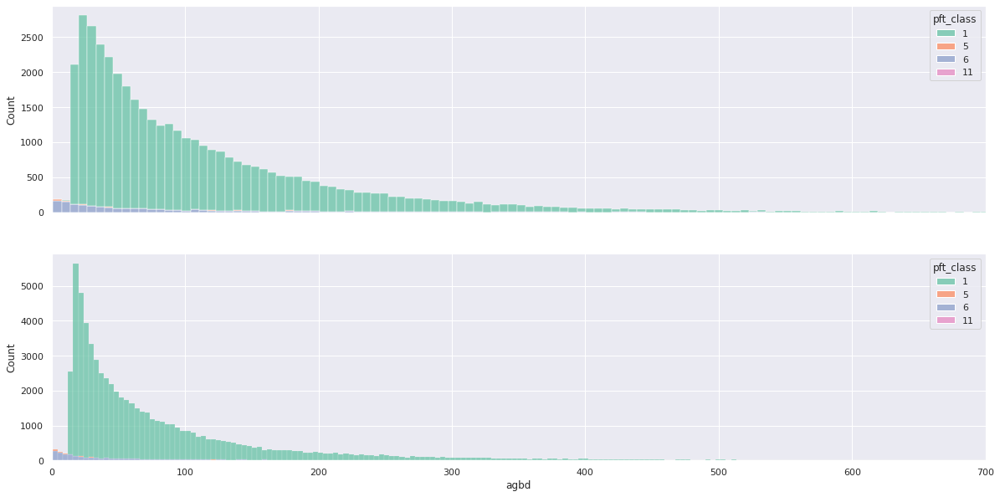

In [33]:
fig, ax = plt.subplots(2, 1, figsize=(20,10), sharex=True)
sns.histplot(before_fire(gedi_dnbr), x='agbd', ax=ax[0], hue='pft_class', multiple='stack', palette='Set2')
g = sns.histplot(after_fire(gedi_dnbr), x='agbd', ax=ax[1], hue='pft_class', multiple='stack', palette='Set2')
ax[1].set_xlim((0, 700))

(0.0, 700.0)

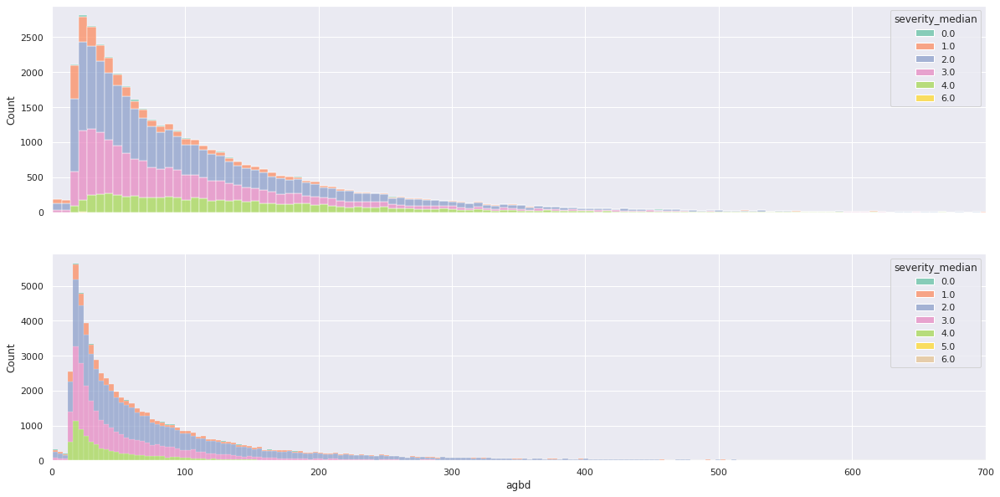

In [36]:
fig, ax = plt.subplots(2, 1, figsize=(20,10), sharex=True)
sns.histplot(before_fire(gedi_dnbr6), x='agbd', ax=ax[0], hue='severity_median', multiple='stack', palette='Set2')
g = sns.histplot(after_fire(gedi_dnbr6), x='agbd', ax=ax[1], hue='severity_median', multiple='stack', palette='Set2')
ax[1].set_xlim((0, 700))

<AxesSubplot: xlabel='agbd', ylabel='severity_median'>

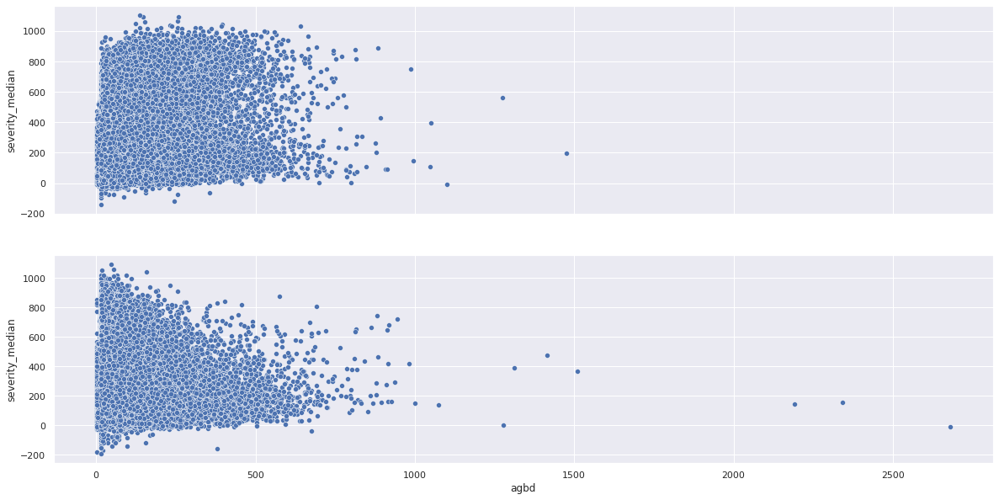

In [37]:
fig, ax = plt.subplots(2, 1, figsize=(20,10), sharex=True)
sns.scatterplot(before_fire(gedi_dnbr), x='agbd', y='severity_median', ax=ax[0])
sns.scatterplot(after_fire(gedi_dnbr), x='agbd', y='severity_median', ax=ax[1])

<AxesSubplot: xlabel='agbd', ylabel='severity_median'>

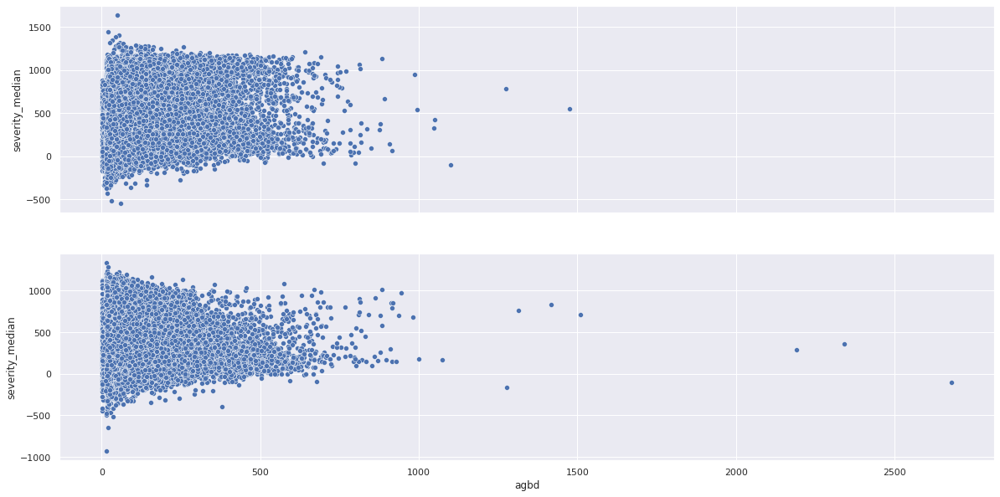

In [38]:
fig, ax = plt.subplots(2, 1, figsize=(20,10), sharex=True)
sns.scatterplot(before_fire(gedi_rdnbr), x='agbd', y='severity_median', ax=ax[0])
sns.scatterplot(after_fire(gedi_rdnbr), x='agbd', y='severity_median', ax=ax[1])

<AxesSubplot: xlabel='agbd', ylabel='severity_median'>

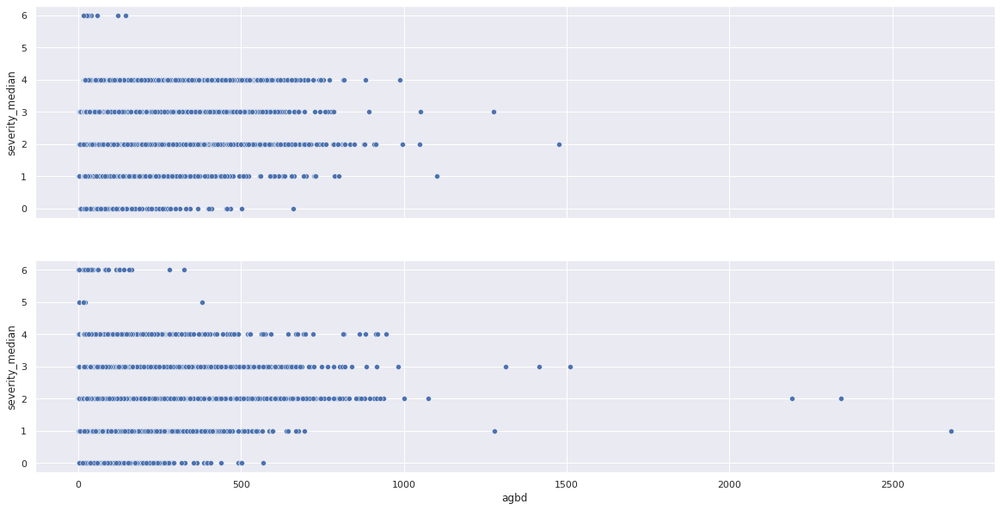

In [40]:
fig, ax = plt.subplots(2, 1, figsize=(20,10), sharex=True)
sns.scatterplot(before_fire(gedi_dnbr6), x='agbd', y='severity_median', ax=ax[0])
sns.scatterplot(after_fire(gedi_dnbr6), x='agbd', y='severity_median', ax=ax[1])

<AxesSubplot: xlabel='severity_median', ylabel='Count'>

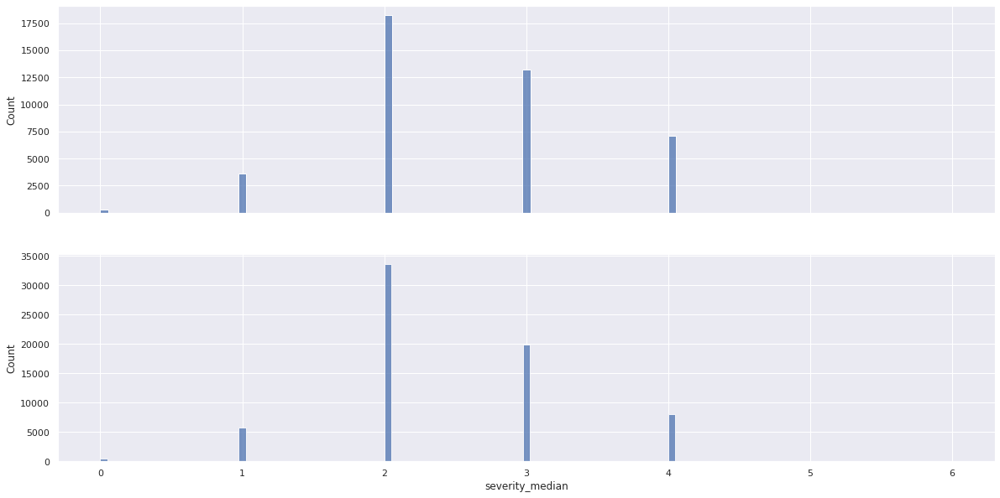

In [41]:
fig, ax = plt.subplots(2, 1, figsize=(20,10), sharex=True)
sns.histplot(before_fire(gedi_dnbr6), x='severity_median', ax=ax[0])
sns.histplot(after_fire(gedi_dnbr6), x='severity_median', ax=ax[1])

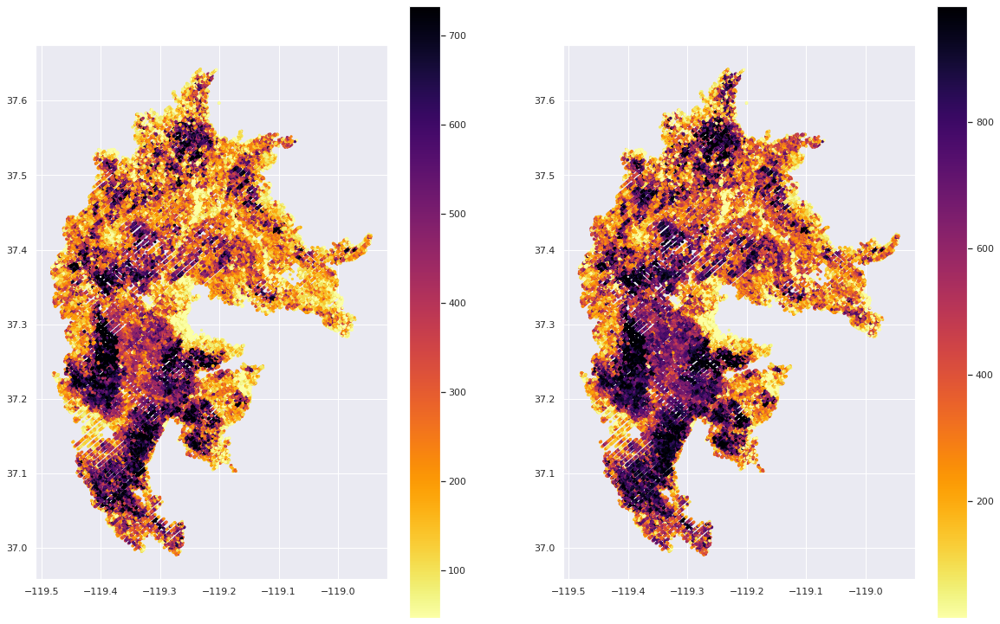

In [134]:
fig, ax = plt.subplots(1, 2, figsize=(20, 13))

geo_plot(gedi_dnbr, ax[0], 'severity_mean')
geo_plot(gedi_rdnbr, ax[1], 'severity_mean')

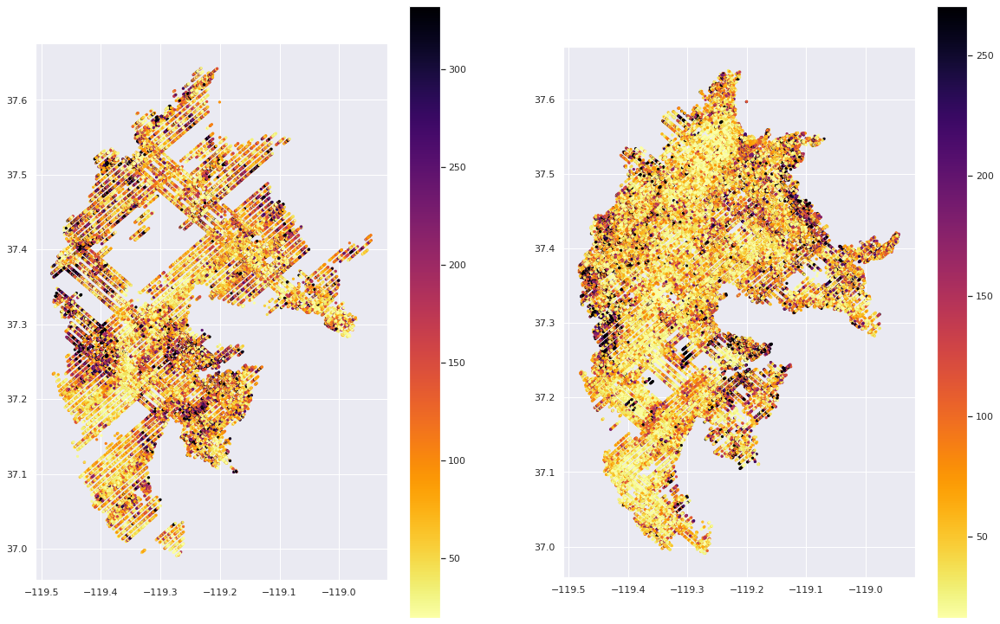

In [135]:
fig, ax = plt.subplots(1, 2, figsize=(20, 13))

geo_plot(before_fire(gedi_dnbr), ax[0], 'agbd')
geo_plot(after_fire(gedi_dnbr), ax[1], 'agbd')

### Look at unburned buffer zone GEDI before and after fire

In [73]:
unburned_before = before_fire(gedi_buffer_dnbr6)
unburned_after = after_fire(gedi_buffer_dnbr6)
print('AGBD before fire')
print(unburned_before.agbd.describe())

print('AGBD after fire')
print(unburned_after.agbd.describe())

AGBD before fire
count    57503.000000
mean       106.045784
std        103.552680
min          0.776436
25%         34.581120
50%         71.073746
75%        143.698608
max       1305.674316
Name: agbd, dtype: float64
AGBD after fire
count    104627.000000
mean         94.441961
std          97.104075
min           0.834731
25%          30.557607
50%          63.248981
75%         126.156799
max        2363.856201
Name: agbd, dtype: float64


In [74]:
unburned_before = before_fire(gedi_buffer_dnbr6[(gedi_buffer_dnbr6.severity_median == 0) & (gedi_buffer_dnbr6.severity_std == 0)])
unburned_after = after_fire(gedi_buffer_dnbr6[(gedi_buffer_dnbr6.severity_median == 0) & (gedi_buffer_dnbr6.severity_std == 0)])
print('AGBD before fire')
print(unburned_before.agbd.describe())

print('AGBD after fire')
print(unburned_after.agbd.describe())

AGBD before fire
count    56378.000000
mean       106.044228
std        103.697477
min          0.776436
25%         34.537249
50%         71.017010
75%        143.601967
max       1305.674316
Name: agbd, dtype: float64
AGBD after fire
count    102480.000000
mean         94.299110
std          97.140815
min           0.834731
25%          30.452015
50%          63.131622
75%         126.034212
max        2363.856201
Name: agbd, dtype: float64


In [75]:
print('AGBD before fire')
print(unburned_before[unburned_before.pft_class==1].agbd.describe())

print('AGBD after fire')
print(unburned_after[unburned_after.pft_class==1].agbd.describe())

AGBD before fire
count    44732.000000
mean       114.540393
std        104.273452
min         12.965409
25%         41.006650
50%         79.959671
75%        153.130283
max        986.387390
Name: agbd, dtype: float64
AGBD after fire
count    73939.000000
mean       103.313199
std         94.408173
min         11.694054
25%         39.555096
50%         73.456268
75%        135.480225
max       2363.856201
Name: agbd, dtype: float64


(0.0, 700.0)

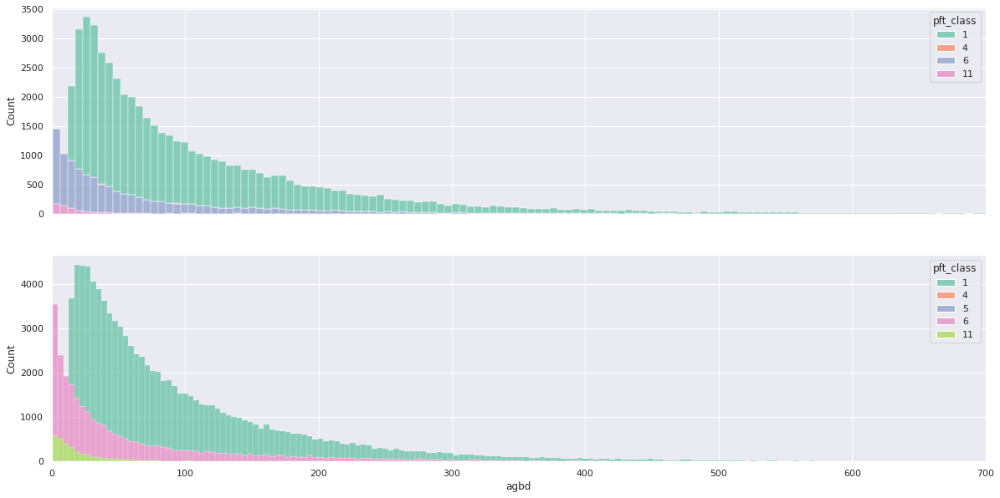

In [51]:
fig, ax = plt.subplots(2, 1, figsize=(20,10), sharex=True)
sns.histplot(before_fire(gedi_buffer_dnbr), x='agbd', ax=ax[0], hue='pft_class', multiple='stack', palette='Set2')
g = sns.histplot(after_fire(gedi_buffer_dnbr), x='agbd', ax=ax[1], hue='pft_class', multiple='stack', palette='Set2')
ax[1].set_xlim((0, 700))

<AxesSubplot: xlabel='agbd', ylabel='severity_median'>

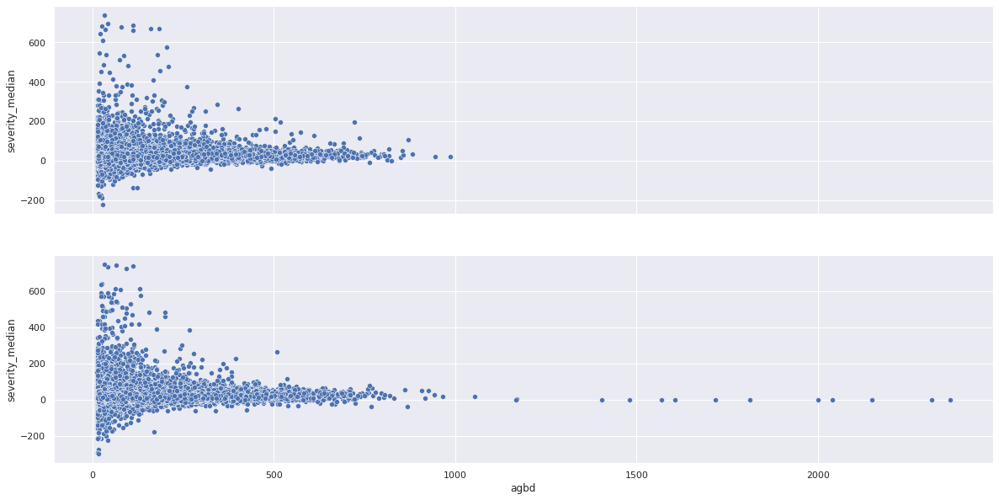

In [52]:
fig, ax = plt.subplots(2, 1, figsize=(20,10), sharex=True)
sns.scatterplot(before_fire(gedi_buffer_dnbr)[before_fire(gedi_buffer_dnbr).pft_class==1], x='agbd', y='severity_median', ax=ax[0])
sns.scatterplot(after_fire(gedi_buffer_dnbr)[after_fire(gedi_buffer_dnbr).pft_class==1], x='agbd', y='severity_median', ax=ax[1])

<AxesSubplot: xlabel='severity_median', ylabel='Count'>

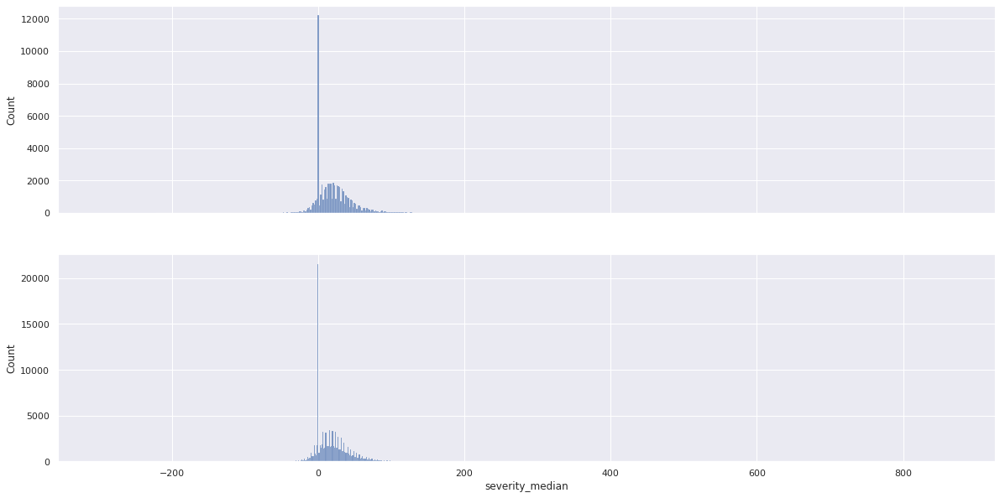

In [53]:
fig, ax = plt.subplots(2, 1, figsize=(20,10), sharex=True)
sns.histplot(before_fire(gedi_buffer_dnbr), x='severity_median', ax=ax[0])
sns.histplot(after_fire(gedi_buffer_dnbr), x='severity_median', ax=ax[1])

<AxesSubplot: xlabel='severity_median', ylabel='Count'>

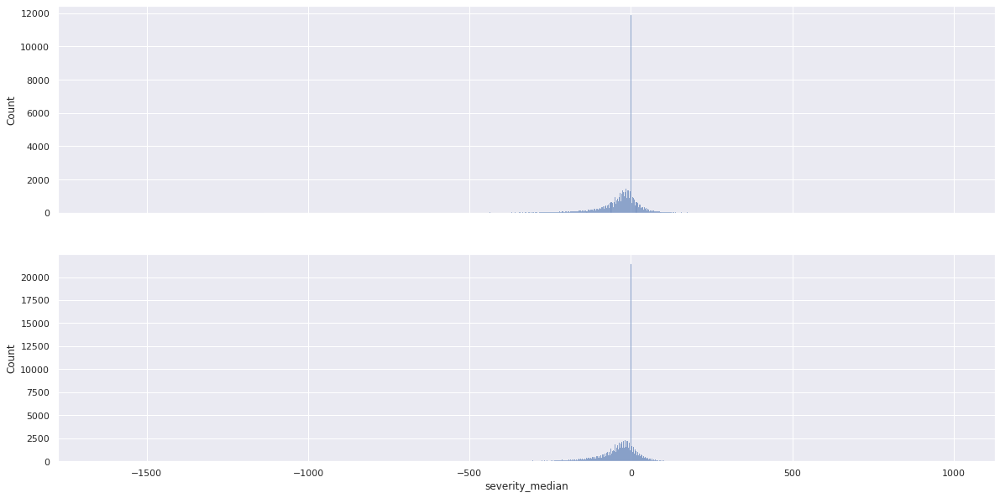

In [54]:
fig, ax = plt.subplots(2, 1, figsize=(20,10), sharex=True)
sns.histplot(before_fire(gedi_buffer_rdnbr), x='severity_median', ax=ax[0])
sns.histplot(after_fire(gedi_buffer_rdnbr), x='severity_median', ax=ax[1])

<AxesSubplot: xlabel='severity_median', ylabel='Count'>

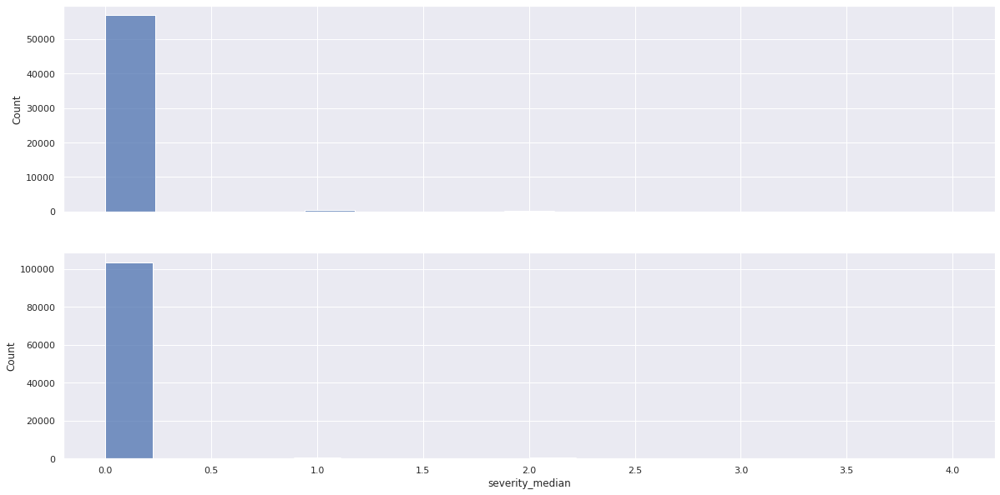

In [55]:
fig, ax = plt.subplots(2, 1, figsize=(20,10), sharex=True)
sns.histplot(before_fire(gedi_buffer_dnbr6), x='severity_median', ax=ax[0])
sns.histplot(after_fire(gedi_buffer_dnbr6), x='severity_median', ax=ax[1])

/home/jk871/drought-with-gedi/drought/lib/python3.10/site-packages/geopandas/plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


<AxesSubplot: >

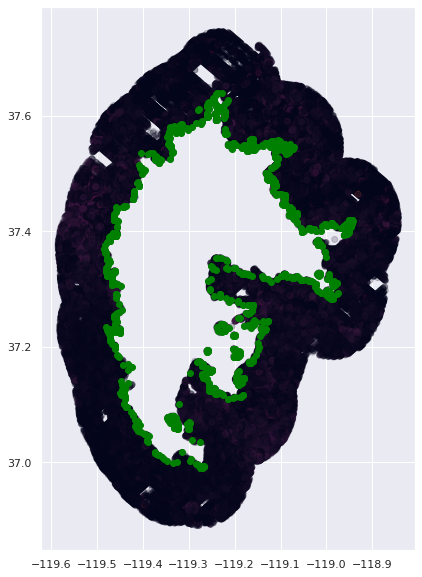

In [57]:
fig, ax = plt.subplots(1, 1, figsize=(15,10))

gedi_buffer_dnbr.plot(column='agbd', ax=ax, alpha=0.2)
gedi_buffer_dnbr6[gedi_buffer_dnbr6.severity_median != 0].plot(column='agbd', ax=ax, color='green')

Interesting, so all the shots in the outer region that have burn severity != 0 are around the fire perimeter. Which means when we're looking for counter-factual, we should focus on those pixels with burn severity of 0.

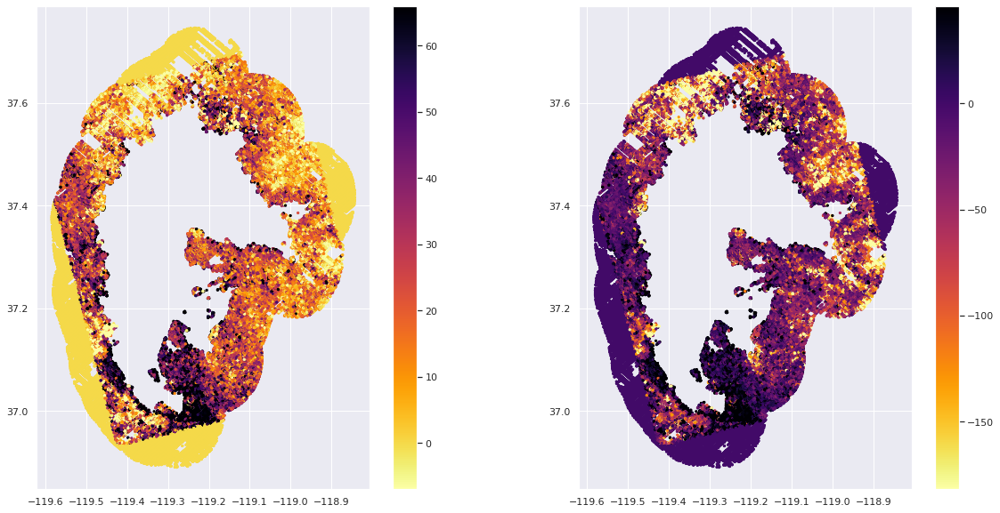

In [68]:

fig, ax = plt.subplots(1, 2, figsize=(20,10))

geo_plot(gedi_buffer_dnbr, ax[0], 'severity_mean')
geo_plot(gedi_buffer_rdnbr, ax[1], 'severity_mean')

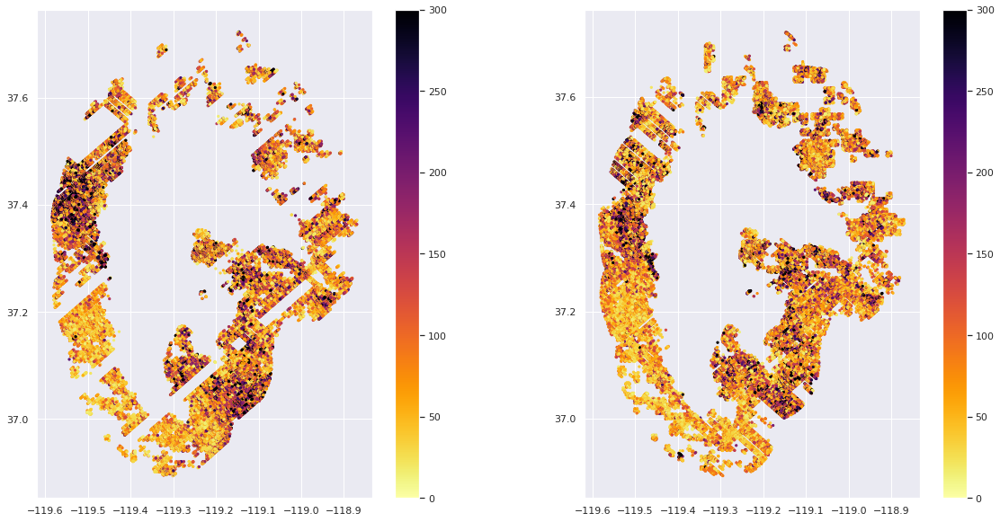

In [107]:

fig, ax = plt.subplots(1, 2, figsize=(20,10))

geo_plot(unburned_before[unburned_before.pft_class==1], ax[0], 'agbd', vmin=0, vmax=300)
geo_plot(unburned_after[unburned_after.pft_class==1], ax[1], 'agbd', vmin=0, vmax=300)

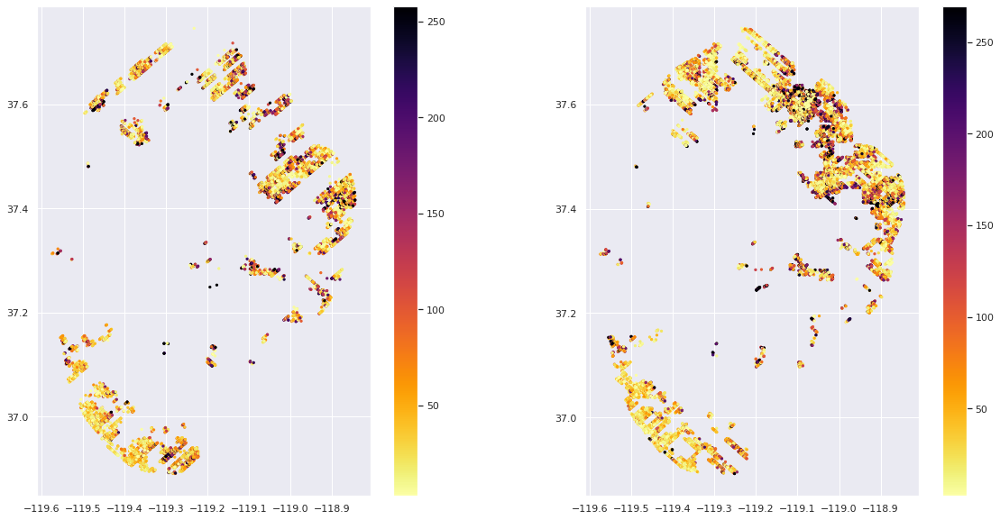

In [109]:

fig, ax = plt.subplots(1, 2, figsize=(20,10))

geo_plot(unburned_before[unburned_before.pft_class==6], ax[0], 'agbd')
geo_plot(unburned_after[unburned_after.pft_class==6], ax[1], 'agbd')

In [110]:
# Divide unburned after into two segments
unburned_after.absolute_time = pd.to_datetime(unburned_after.absolute_time, utc=True)

In [93]:
unburned_after_1 = unburned_after[unburned_after.absolute_time < '01-01-2022']

In [94]:
unburned_after_2 = unburned_after[unburned_after.absolute_time > '01-01-2022']

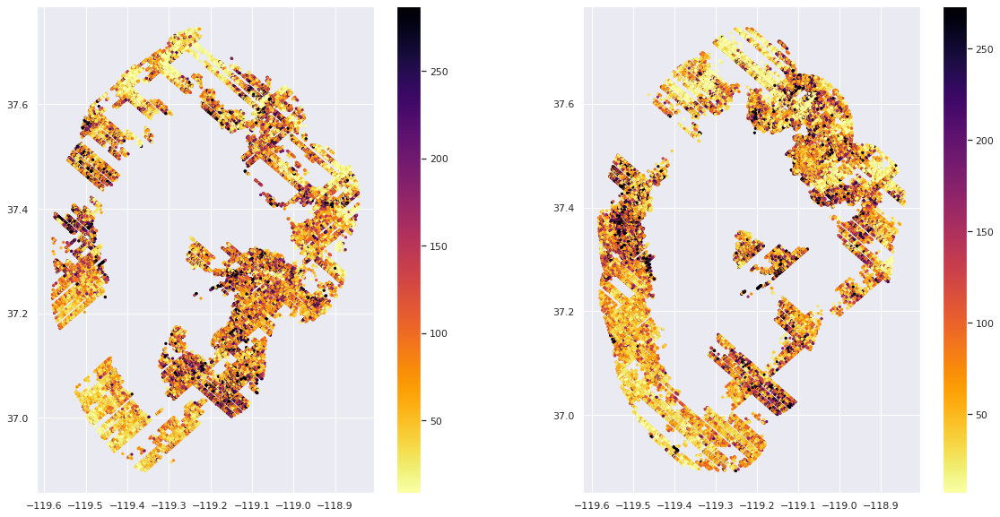

In [97]:

fig, ax = plt.subplots(1, 2, figsize=(20,10))

geo_plot(unburned_after_1, ax[0], 'agbd')
geo_plot(unburned_after_2, ax[1], 'agbd')

In [98]:
print('AGBD before fire')
print(unburned_after_1.agbd.describe())

print('AGBD after fire')
print(unburned_after_2.agbd.describe())

AGBD before fire
count    47360.000000
mean        98.988786
std         97.342301
min          0.834731
25%         33.005688
50%         68.399879
75%        133.249561
max       1651.483032
Name: agbd, dtype: float64
AGBD after fire
count    55120.000000
mean        90.269665
std         96.786913
min          0.858635
25%         28.709408
50%         58.616560
75%        119.831600
max       2363.856201
Name: agbd, dtype: float64


In [90]:
all_times = pd.to_datetime(creek.gedi.sort_values('absolute_time').absolute_time, utc=True)

In [88]:
all_times_before = pd.to_datetime(unburned_before.sort_values('absolute_time').absolute_time, utc=True)

In [96]:
unburned_after_2.absolute_time.dt.date.unique()

array([datetime.date(2022, 7, 22), datetime.date(2022, 1, 11),
       datetime.date(2022, 9, 9), datetime.date(2022, 3, 3),
       datetime.date(2022, 4, 10), datetime.date(2022, 11, 22),
       datetime.date(2022, 1, 24), datetime.date(2022, 9, 14),
       datetime.date(2022, 12, 18), datetime.date(2022, 10, 10),
       datetime.date(2022, 5, 10), datetime.date(2022, 1, 16),
       datetime.date(2022, 5, 19), datetime.date(2022, 2, 26),
       datetime.date(2022, 11, 18), datetime.date(2022, 11, 17),
       datetime.date(2022, 8, 18), datetime.date(2022, 6, 26),
       datetime.date(2022, 1, 20), datetime.date(2022, 5, 15),
       datetime.date(2022, 4, 13), datetime.date(2022, 4, 14),
       datetime.date(2022, 5, 14), datetime.date(2022, 2, 22),
       datetime.date(2022, 1, 7), datetime.date(2022, 12, 17),
       datetime.date(2022, 5, 18), datetime.date(2022, 1, 15),
       datetime.date(2022, 7, 26), datetime.date(2022, 8, 13)],
      dtype=object)

In [89]:
all_times_before.dt.date.unique()

array([datetime.date(2019, 4, 25), datetime.date(2019, 5, 2),
       datetime.date(2019, 5, 8), datetime.date(2019, 5, 9),
       datetime.date(2019, 6, 17), datetime.date(2019, 7, 13),
       datetime.date(2019, 7, 28), datetime.date(2019, 8, 7),
       datetime.date(2019, 9, 13), datetime.date(2019, 9, 18),
       datetime.date(2019, 10, 10), datetime.date(2019, 10, 14),
       datetime.date(2019, 11, 2), datetime.date(2019, 11, 6),
       datetime.date(2019, 12, 2), datetime.date(2020, 6, 26),
       datetime.date(2020, 6, 30), datetime.date(2020, 7, 4),
       datetime.date(2020, 7, 8), datetime.date(2020, 7, 12)],
      dtype=object)

In [100]:
gedi_dnbr.corr()

/tmp/ipykernel_4169458/608907356.py:1: FutureWarning: The default value of numeric_only in GeoDataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  gedi_dnbr.corr()


,shot_number,lon_lowestmode,lat_lowestmode,agbd,agbd_pi_lower,agbd_pi_upper,agbd_se,sensitivity,pft_class,severity_sample,severity_mean,severity_std,severity_median
shot_number,1.000000,0.012291,0.166844,-0.156687,-0.162302,-0.166894,0.002270,-0.211113,-0.003409,-0.052717,-0.051289,-0.005277,-0.052281
lon_lowestmode,0.012291,1.000000,0.264490,0.025284,0.066518,0.020692,-0.084964,-0.047579,0.087887,-0.270873,-0.291659,-0.021666,-0.288592
lat_lowestmode,0.166844,0.264490,1.000000,0.021801,0.022007,0.013787,-0.080353,-0.121222,0.083490,-0.263678,-0.280956,0.017548,-0.280773
agbd,-0.156687,0.025284,0.021801,1.000000,0.423876,0.990183,-0.014346,0.173772,0.026084,-0.031167,-0.035368,-0.027104,-0.034098
agbd_pi_lower,-0.162302,0.066518,0.022007,0.423876,1.000000,0.467366,-0.044537,0.173402,0.048778,-0.055383,-0.066626,-0.022245,-0.064231
agbd_pi_upper,-0.166894,0.020692,0.013787,0.990183,0.467366,1.000000,0.092385,0.202819,-0.081188,-0.021000,-0.024844,-0.024895,-0.023599
agbd_se,0.002270,-0.084964,-0.080353,-0.014346,-0.044537,0.092385,1.000000,0.169438,-0.996222,0.125734,0.136518,0.036748,0.134873
sensitivity,-0.211113,-0.047579,-0.121222,0.173772,0.173402,0.202819,0.169438,1.000000,-0.167523,0.076302,0.077087,-0.020685,0.077614
pft_class,-0.003409,0.087887,0.083490,0.026084,0.048778,-0.081188,-0.996222,-0.167523,1.000000,-0.127086,-0.138150,-0.036471,-0.136474
severity_sample,-0.052717,-0.270873,-0.263678,-0.031167,-0.055383,-0.021000,0.125734,0.076302,-0.127086,1.000000,0.958957,0.202306,0.961977


In [101]:
before_fire(gedi_dnbr).corr()

/tmp/ipykernel_4169458/795121377.py:1: FutureWarning: The default value of numeric_only in GeoDataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  before_fire(gedi_dnbr).corr()


,shot_number,lon_lowestmode,lat_lowestmode,agbd,agbd_pi_lower,agbd_pi_upper,agbd_se,sensitivity,pft_class,severity_sample,severity_mean,severity_std,severity_median
shot_number,1.000000,0.161146,-0.152563,-0.016801,0.021204,-0.012658,0.025688,0.046230,-0.024983,0.042693,0.044140,-0.007411,0.043805
lon_lowestmode,0.161146,1.000000,0.207529,-0.044781,-0.008114,-0.048652,-0.039454,-0.096967,0.042197,-0.271135,-0.292461,-0.008815,-0.288547
lat_lowestmode,-0.152563,0.207529,1.000000,0.038277,0.029213,0.029890,-0.087169,-0.136018,0.090421,-0.271101,-0.290334,0.003328,-0.288838
agbd,-0.016801,-0.044781,0.038277,1.000000,0.376057,0.991438,0.013330,0.170036,-0.001886,0.150144,0.148411,0.019122,0.148804
agbd_pi_lower,0.021204,-0.008114,0.029213,0.376057,1.000000,0.413195,-0.023617,0.172996,0.028077,0.142316,0.135880,0.032635,0.137176
agbd_pi_upper,-0.012658,-0.048652,0.029890,0.991438,0.413195,1.000000,0.115701,0.198664,-0.104669,0.172473,0.171560,0.025935,0.171833
agbd_se,0.025688,-0.039454,-0.087169,0.013330,-0.023617,0.115701,1.000000,0.192395,-0.995487,0.143882,0.155575,0.051065,0.153550
sensitivity,0.046230,-0.096967,-0.136018,0.170036,0.172996,0.198664,0.192395,1.000000,-0.189441,0.161352,0.162464,0.007975,0.162600
pft_class,-0.024983,0.042197,0.090421,-0.001886,0.028077,-0.104669,-0.995487,-0.189441,1.000000,-0.144337,-0.156360,-0.050731,-0.154308
severity_sample,0.042693,-0.271135,-0.271101,0.150144,0.142316,0.172473,0.143882,0.161352,-0.144337,1.000000,0.962491,0.249487,0.963708


In [102]:
before_fire(gedi_rdnbr).corr()

/tmp/ipykernel_4169458/2486856634.py:1: FutureWarning: The default value of numeric_only in GeoDataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  before_fire(gedi_rdnbr).corr()


,shot_number,lon_lowestmode,lat_lowestmode,agbd,agbd_pi_lower,agbd_pi_upper,agbd_se,sensitivity,pft_class,severity_sample,severity_mean,severity_std,severity_median
shot_number,1.000000,0.161146,-0.152563,-0.016801,0.021204,-0.012658,0.025688,0.046230,-0.024983,0.025323,0.026088,-0.015776,0.026429
lon_lowestmode,0.161146,1.000000,0.207529,-0.044781,-0.008114,-0.048652,-0.039454,-0.096967,0.042197,-0.230823,-0.255444,0.129336,-0.253211
lat_lowestmode,-0.152563,0.207529,1.000000,0.038277,0.029213,0.029890,-0.087169,-0.136018,0.090421,-0.232454,-0.253850,0.127534,-0.253831
agbd,-0.016801,-0.044781,0.038277,1.000000,0.376057,0.991438,0.013330,0.170036,-0.001886,0.051322,0.055576,-0.083679,0.055584
agbd_pi_lower,0.021204,-0.008114,0.029213,0.376057,1.000000,0.413195,-0.023617,0.172996,0.028077,0.078374,0.076466,-0.088822,0.078227
agbd_pi_upper,-0.012658,-0.048652,0.029890,0.991438,0.413195,1.000000,0.115701,0.198664,-0.104669,0.068180,0.074200,-0.095580,0.074222
agbd_se,0.025688,-0.039454,-0.087169,0.013330,-0.023617,0.115701,1.000000,0.192395,-0.995487,0.119403,0.136006,-0.073602,0.135073
sensitivity,0.046230,-0.096967,-0.136018,0.170036,0.172996,0.198664,0.192395,1.000000,-0.189441,0.122645,0.126954,-0.098899,0.129382
pft_class,-0.024983,0.042197,0.090421,-0.001886,0.028077,-0.104669,-0.995487,-0.189441,1.000000,-0.121728,-0.139192,0.072276,-0.137931
severity_sample,0.025323,-0.230823,-0.232454,0.051322,0.078374,0.068180,0.119403,0.122645,-0.121728,1.000000,0.937976,-0.069866,0.936269


In [104]:
after_fire(gedi_dnbr).corr()

/tmp/ipykernel_4169458/861096128.py:1: FutureWarning: The default value of numeric_only in GeoDataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  after_fire(gedi_dnbr).corr()


,shot_number,lon_lowestmode,lat_lowestmode,agbd,agbd_pi_lower,agbd_pi_upper,agbd_se,sensitivity,pft_class,severity_sample,severity_mean,severity_std,severity_median
shot_number,1.000000,-0.085777,0.243320,-0.079059,-0.066615,-0.081812,0.015746,0.064048,-0.016659,0.044211,0.046699,0.006891,0.045351
lon_lowestmode,-0.085777,1.000000,0.299502,0.077321,0.106614,0.072080,-0.111373,-0.018345,0.114494,-0.271161,-0.291799,-0.027425,-0.289295
lat_lowestmode,0.243320,0.299502,1.000000,0.046053,0.052886,0.040711,-0.076029,-0.065000,0.079372,-0.246504,-0.262946,0.026164,-0.263530
agbd,-0.079059,0.077321,0.046053,1.000000,0.439513,0.988868,-0.035629,0.126590,0.047623,-0.193579,-0.199931,-0.054782,-0.198419
agbd_pi_lower,-0.066615,0.106614,0.052886,0.439513,1.000000,0.487018,-0.057299,0.124159,0.061324,-0.182988,-0.197369,-0.044365,-0.194697
agbd_pi_upper,-0.081812,0.072080,0.040711,0.988868,0.487018,1.000000,0.076931,0.154073,-0.065571,-0.193030,-0.199379,-0.054872,-0.197852
agbd_se,0.015746,-0.111373,-0.076029,-0.035629,-0.057299,0.076931,1.000000,0.163995,-0.996667,0.113760,0.123998,0.030558,0.122587
sensitivity,0.064048,-0.018345,-0.065000,0.126590,0.124159,0.154073,0.163995,1.000000,-0.162971,-0.002355,-0.001556,-0.036204,-0.001142
pft_class,-0.016659,0.114494,0.079372,0.047623,0.061324,-0.065571,-0.996667,-0.162971,1.000000,-0.115817,-0.126301,-0.030308,-0.124859
severity_sample,0.044211,-0.271161,-0.246504,-0.193579,-0.182988,-0.193030,0.113760,-0.002355,-0.115817,1.000000,0.955912,0.183253,0.960295


In [105]:
after_fire(gedi_rdnbr).corr()

/tmp/ipykernel_4169458/1135705856.py:1: FutureWarning: The default value of numeric_only in GeoDataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  after_fire(gedi_rdnbr).corr()


,shot_number,lon_lowestmode,lat_lowestmode,agbd,agbd_pi_lower,agbd_pi_upper,agbd_se,sensitivity,pft_class,severity_sample,severity_mean,severity_std,severity_median
shot_number,1.000000,-0.085777,0.243320,-0.079059,-0.066615,-0.081812,0.015746,0.064048,-0.016659,0.051675,0.054117,-0.004311,0.053456
lon_lowestmode,-0.085777,1.000000,0.299502,0.077321,0.106614,0.072080,-0.111373,-0.018345,0.114494,-0.241854,-0.268753,0.069401,-0.266987
lat_lowestmode,0.243320,0.299502,1.000000,0.046053,0.052886,0.040711,-0.076029,-0.065000,0.079372,-0.197324,-0.218346,0.109874,-0.218957
agbd,-0.079059,0.077321,0.046053,1.000000,0.439513,0.988868,-0.035629,0.126590,0.047623,-0.244264,-0.257228,-0.054790,-0.260135
agbd_pi_lower,-0.066615,0.106614,0.052886,0.439513,1.000000,0.487018,-0.057299,0.124159,0.061324,-0.227513,-0.248033,-0.033937,-0.249222
agbd_pi_upper,-0.081812,0.072080,0.040711,0.988868,0.487018,1.000000,0.076931,0.154073,-0.065571,-0.249157,-0.262308,-0.063641,-0.265422
agbd_se,0.015746,-0.111373,-0.076029,-0.035629,-0.057299,0.076931,1.000000,0.163995,-0.996667,0.085505,0.097039,-0.060785,0.096928
sensitivity,0.064048,-0.018345,-0.065000,0.126590,0.124159,0.154073,0.163995,1.000000,-0.162971,-0.021699,-0.021355,-0.052587,-0.020552
pft_class,-0.016659,0.114494,0.079372,0.047623,0.061324,-0.065571,-0.996667,-0.162971,1.000000,-0.089440,-0.101602,0.059970,-0.101349
severity_sample,0.051675,-0.241854,-0.197324,-0.244264,-0.227513,-0.249157,0.085505,-0.021699,-0.089440,1.000000,0.928209,-0.029626,0.926948


### Correlation for perfectly matched GEDI pixels

In [118]:
gedi_dnbr6_perfect = gedi_dnbr6[gedi_dnbr6.severity_std == 0]
gedi_dnbr6

,shot_number,absolute_time,lon_lowestmode,lat_lowestmode,agbd,agbd_pi_lower,agbd_pi_upper,agbd_se,beam_type,sensitivity,pft_class,geometry,severity_3x3,severity_sample,severity_mean,severity_std,severity_median
0,154280500300290322,2021-09-02 16:59:13.930352+01:00,-119.073946,37.326553,40.928005,0.832434,141.196701,11.109954,full,0.955587,1,POINT (-119.07395 37.32655),"[2, 2, 2, 2, 2, 2, 3, 3, 2]",2,2.222222,0.415740,2.0
1,154280500300290324,2021-09-02 16:59:13.946884+01:00,-119.072975,37.325882,73.325890,9.375071,197.802658,11.175099,full,0.986906,1,POINT (-119.07298 37.32588),"[2, 3, 2, 3, 3, 2, 3, 3, 3]",3,2.666667,0.471405,3.0
2,154280500300290325,2021-09-02 16:59:13.955150+01:00,-119.072488,37.325545,38.910450,0.567278,137.416275,11.108020,full,0.981586,1,POINT (-119.07249 37.32554),"[3, 2, 2, 3, 3, 2, 3, 3, 2]",3,2.555556,0.496904,3.0
3,154280500300290330,2021-09-02 16:59:13.996480+01:00,-119.070055,37.323864,216.127350,84.769859,407.857635,11.146821,full,0.958319,1,POINT (-119.07005 37.32386),"[2, 2, 2, 2, 2, 2, 2, 2, 2]",2,2.000000,0.000000,2.0
5,154280600300527837,2021-09-02 16:59:13.917954+01:00,-119.076065,37.320751,196.798264,72.984306,380.791321,11.111056,full,0.981729,1,POINT (-119.07606 37.32075),"[2, 2, 2, 2, 2, 2, 2, 2, 2]",2,2.000000,0.000000,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
229964,216780800200084784,2022-10-10 18:25:07.236633+01:00,-119.420310,37.388862,73.634796,9.599105,197.793335,11.100669,full,0.970735,1,POINT (-119.42031 37.38886),"[2, 3, 4, 3, 3, 3, 3, 3, 3]",3,3.000000,0.471405,3.0
229971,163690800200084240,2021-11-02 08:56:04.774172+00:00,-119.420768,37.388313,147.904694,44.574299,311.410095,11.110306,full,0.955997,1,POINT (-119.42077 37.38831),"[3, 4, 4, 4, 4, 3, 3, 3, 4]",4,3.555556,0.496904,4.0
229983,138990100200119877,2021-05-27 00:56:27.074130+01:00,-119.415389,37.387338,44.198250,1.355944,147.183075,11.104300,coverage,0.955121,1,POINT (-119.41539 37.38734),"[1, 3, 2, 1, 2, 2, 1, 1, 1]",2,1.555556,0.684935,1.0
229984,138990100200119878,2021-05-27 00:56:27.082394+01:00,-119.414900,37.387674,51.832397,2.943956,160.862259,11.104096,coverage,0.952666,1,POINT (-119.41490 37.38767),"[1, 1, 1, 1, 1, 1, 2, 1, 2]",1,1.222222,0.415740,1.0


In [124]:
gedi_dnbr_perfect = gedi_dnbr[gedi_dnbr6.severity_std == 0]
gedi_rdnbr_perfect = gedi_rdnbr[gedi_dnbr6.severity_std == 0]

In [126]:
before_fire(gedi_dnbr_perfect).corr()

/tmp/ipykernel_4169458/3282129187.py:1: FutureWarning: The default value of numeric_only in GeoDataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  before_fire(gedi_dnbr_perfect).corr()


,shot_number,lon_lowestmode,lat_lowestmode,agbd,agbd_pi_lower,agbd_pi_upper,agbd_se,sensitivity,pft_class,severity_sample,severity_mean,severity_std,severity_median
shot_number,1.000000,0.099540,-0.132502,-0.005256,0.027829,0.000047,0.037166,0.050869,-0.034989,0.080819,0.083023,0.025849,0.083022
lon_lowestmode,0.099540,1.000000,0.272340,-0.078862,-0.023828,-0.083859,-0.040988,-0.139105,0.044341,-0.330343,-0.338479,-0.047754,-0.337254
lat_lowestmode,-0.132502,0.272340,1.000000,-0.003119,-0.014975,-0.013133,-0.088576,-0.173515,0.092015,-0.390630,-0.397699,-0.095929,-0.396368
agbd,-0.005256,-0.078862,-0.003119,1.000000,0.370648,0.992833,0.044872,0.169298,-0.033060,0.213528,0.213707,0.165868,0.213289
agbd_pi_lower,0.027829,-0.023828,-0.014975,0.370648,1.000000,0.405211,-0.017543,0.176537,0.022598,0.155609,0.153782,0.104043,0.153253
agbd_pi_upper,0.000047,-0.083859,-0.013133,0.992833,0.405211,1.000000,0.137189,0.196891,-0.125687,0.235377,0.235665,0.177518,0.235201
agbd_se,0.037166,-0.040988,-0.088576,0.044872,-0.017543,0.137189,1.000000,0.202553,-0.994188,0.158910,0.161790,0.094677,0.161448
sensitivity,0.050869,-0.139105,-0.173515,0.169298,0.176537,0.196891,0.202553,1.000000,-0.198812,0.183876,0.183209,0.054030,0.183837
pft_class,-0.034989,0.044341,0.092015,-0.033060,0.022598,-0.125687,-0.994188,-0.198812,1.000000,-0.159746,-0.162683,-0.092518,-0.162369
severity_sample,0.080819,-0.330343,-0.390630,0.213528,0.155609,0.235377,0.158910,0.183876,-0.159746,1.000000,0.988544,0.406667,0.988378


In [127]:
after_fire(gedi_dnbr_perfect).corr()

/tmp/ipykernel_4169458/1420271049.py:1: FutureWarning: The default value of numeric_only in GeoDataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  after_fire(gedi_dnbr_perfect).corr()


,shot_number,lon_lowestmode,lat_lowestmode,agbd,agbd_pi_lower,agbd_pi_upper,agbd_se,sensitivity,pft_class,severity_sample,severity_mean,severity_std,severity_median
shot_number,1.000000,-0.102480,0.195410,-0.077647,-0.059653,-0.077864,0.029951,0.091058,-0.031677,0.050943,0.051440,0.016065,0.050951
lon_lowestmode,-0.102480,1.000000,0.338821,0.066301,0.117472,0.063046,-0.112296,-0.016283,0.113097,-0.329117,-0.336313,-0.050397,-0.335329
lat_lowestmode,0.195410,0.338821,1.000000,0.079541,0.077356,0.074597,-0.092746,-0.067991,0.097941,-0.375215,-0.383293,-0.025852,-0.382136
agbd,-0.077647,0.066301,0.079541,1.000000,0.429723,0.989339,-0.021710,0.112977,0.034062,-0.246448,-0.247219,-0.053888,-0.248606
agbd_pi_lower,-0.059653,0.117472,0.077356,0.429723,1.000000,0.478467,-0.041762,0.125098,0.045064,-0.253270,-0.259527,-0.061076,-0.259547
agbd_pi_upper,-0.077864,0.063046,0.074597,0.989339,0.478467,1.000000,0.084921,0.139697,-0.073250,-0.251919,-0.252621,-0.051065,-0.254029
agbd_se,0.029951,-0.112296,-0.092746,-0.021710,-0.041762,0.084921,1.000000,0.165198,-0.994984,0.114450,0.120663,0.071577,0.119882
sensitivity,0.091058,-0.016283,-0.067991,0.112977,0.125098,0.139697,0.165198,1.000000,-0.164416,-0.004752,-0.003678,-0.018409,-0.004435
pft_class,-0.031677,0.113097,0.097941,0.034062,0.045064,-0.073250,-0.994984,-0.164416,1.000000,-0.118051,-0.124445,-0.073005,-0.123649
severity_sample,0.050943,-0.329117,-0.375215,-0.246448,-0.253270,-0.251919,0.114450,-0.004752,-0.118051,1.000000,0.986188,0.345280,0.985990


In [128]:
before_fire(gedi_rdnbr_perfect).corr()

/tmp/ipykernel_4169458/1910963025.py:1: FutureWarning: The default value of numeric_only in GeoDataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  before_fire(gedi_rdnbr_perfect).corr()


,shot_number,lon_lowestmode,lat_lowestmode,agbd,agbd_pi_lower,agbd_pi_upper,agbd_se,sensitivity,pft_class,severity_sample,severity_mean,severity_std,severity_median
shot_number,1.000000,0.099540,-0.132502,-0.005256,0.027829,0.000047,0.037166,0.050869,-0.034989,0.071161,0.072412,-0.025618,0.072805
lon_lowestmode,0.099540,1.000000,0.272340,-0.078862,-0.023828,-0.083859,-0.040988,-0.139105,0.044341,-0.290728,-0.305425,0.158858,-0.308174
lat_lowestmode,-0.132502,0.272340,1.000000,-0.003119,-0.014975,-0.013133,-0.088576,-0.173515,0.092015,-0.363623,-0.373430,0.123840,-0.375397
agbd,-0.005256,-0.078862,-0.003119,1.000000,0.370648,0.992833,0.044872,0.169298,-0.033060,0.122182,0.129585,-0.087363,0.130530
agbd_pi_lower,0.027829,-0.023828,-0.014975,0.370648,1.000000,0.405211,-0.017543,0.176537,0.022598,0.104727,0.104994,-0.096337,0.105467
agbd_pi_upper,0.000047,-0.083859,-0.013133,0.992833,0.405211,1.000000,0.137189,0.196891,-0.125687,0.140630,0.148439,-0.102328,0.149414
agbd_se,0.037166,-0.040988,-0.088576,0.044872,-0.017543,0.137189,1.000000,0.202553,-0.994188,0.140801,0.148481,-0.107539,0.147732
sensitivity,0.050869,-0.139105,-0.173515,0.169298,0.176537,0.196891,0.202553,1.000000,-0.198812,0.154873,0.156964,-0.121585,0.159308
pft_class,-0.034989,0.044341,0.092015,-0.033060,0.022598,-0.125687,-0.994188,-0.198812,1.000000,-0.143964,-0.152012,0.103317,-0.150835
severity_sample,0.071161,-0.290728,-0.363623,0.122182,0.104727,0.140630,0.140801,0.154873,-0.143964,1.000000,0.973056,-0.148782,0.971794


In [129]:
after_fire(gedi_rdnbr_perfect).corr()

/tmp/ipykernel_4169458/400803325.py:1: FutureWarning: The default value of numeric_only in GeoDataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  after_fire(gedi_rdnbr_perfect).corr()


,shot_number,lon_lowestmode,lat_lowestmode,agbd,agbd_pi_lower,agbd_pi_upper,agbd_se,sensitivity,pft_class,severity_sample,severity_mean,severity_std,severity_median
shot_number,1.000000,-0.102480,0.195410,-0.077647,-0.059653,-0.077864,0.029951,0.091058,-0.031677,0.056766,0.056798,-0.004206,0.055953
lon_lowestmode,-0.102480,1.000000,0.338821,0.066301,0.117472,0.063046,-0.112296,-0.016283,0.113097,-0.295831,-0.305972,0.115456,-0.307519
lat_lowestmode,0.195410,0.338821,1.000000,0.079541,0.077356,0.074597,-0.092746,-0.067991,0.097941,-0.340089,-0.350781,0.126082,-0.352953
agbd,-0.077647,0.066301,0.079541,1.000000,0.429723,0.989339,-0.021710,0.112977,0.034062,-0.288991,-0.289183,-0.031806,-0.294181
agbd_pi_lower,-0.059653,0.117472,0.077356,0.429723,1.000000,0.478467,-0.041762,0.125098,0.045064,-0.287725,-0.296386,-0.005324,-0.300444
agbd_pi_upper,-0.077864,0.063046,0.074597,0.989339,0.478467,1.000000,0.084921,0.139697,-0.073250,-0.298110,-0.298899,-0.040702,-0.304016
agbd_se,0.029951,-0.112296,-0.092746,-0.021710,-0.041762,0.084921,1.000000,0.165198,-0.994984,0.092477,0.095937,-0.089755,0.097554
sensitivity,0.091058,-0.016283,-0.067991,0.112977,0.125098,0.139697,0.165198,1.000000,-0.164416,-0.021973,-0.024196,-0.040147,-0.023483
pft_class,-0.031677,0.113097,0.097941,0.034062,0.045064,-0.073250,-0.994984,-0.164416,1.000000,-0.098110,-0.102030,0.087058,-0.103541
severity_sample,0.056766,-0.295831,-0.340089,-0.288991,-0.287725,-0.298110,0.092477,-0.021973,-0.098110,1.000000,0.971424,-0.143877,0.970060


### Visualize severity for combined GEDI

In [137]:
gedi_all = pd.concat([creek.gedi, creek.gedi_buffer])

In [147]:
gedi_all_dnbr = pd.concat([gedi_dnbr, gedi_buffer_dnbr])

<AxesSubplot: >

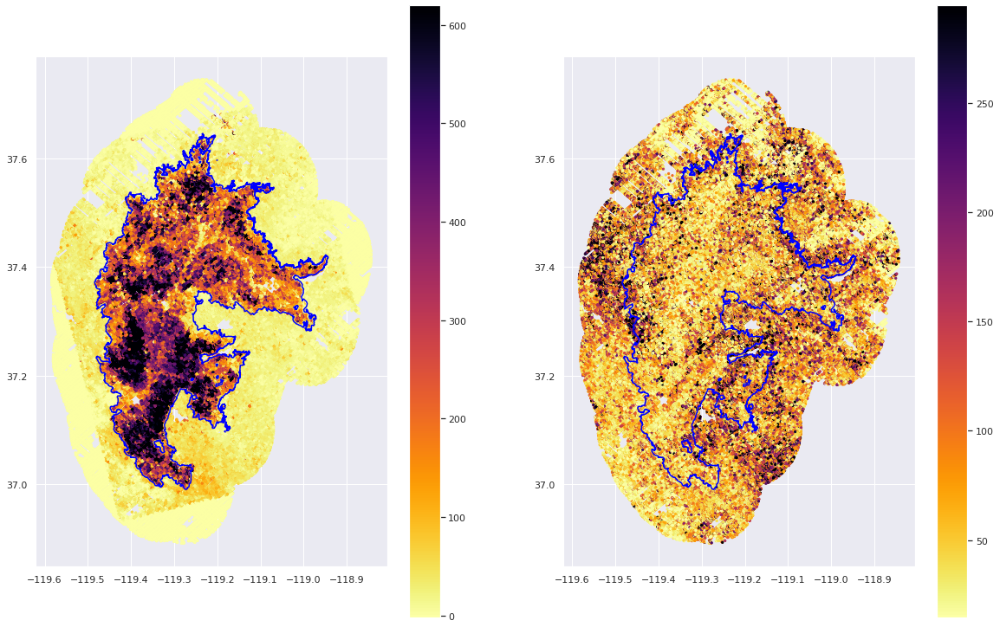

In [148]:
fig, ax = plt.subplots(1, 2, figsize=(20, 13))

geo_plot(gedi_all_dnbr, ax[0], 'severity_mean')
geo_plot(gedi_all, ax[1], 'agbd')
creek.fire.boundary.plot(ax=ax[0], color='blue')
creek.fire.boundary.plot(ax=ax[1], color='blue')

<AxesSubplot: >

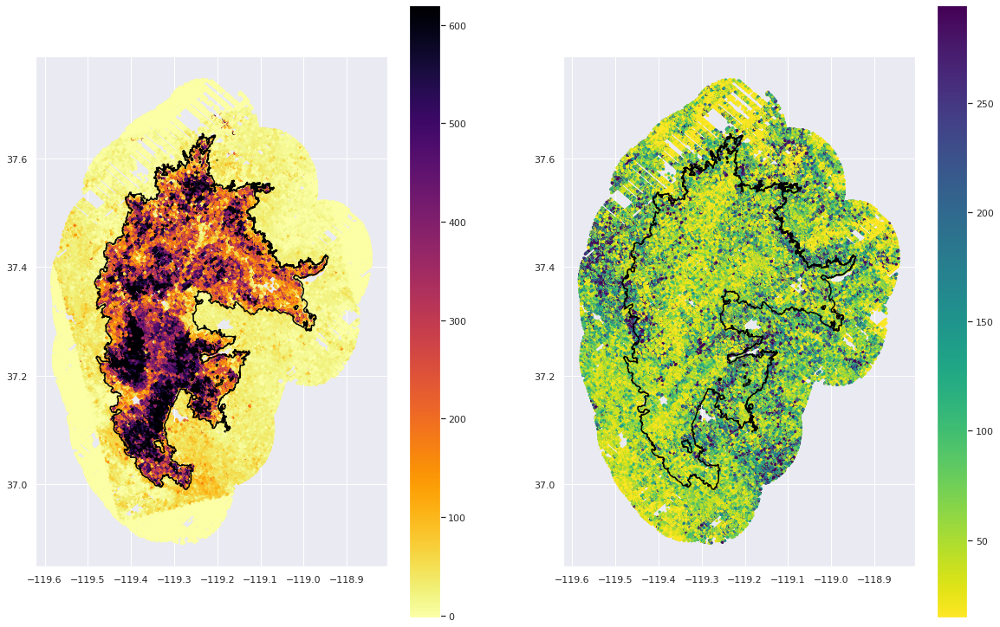

In [151]:
fig, ax = plt.subplots(1, 2, figsize=(20, 13))

geo_plot(gedi_all_dnbr, ax[0], 'severity_mean')
gedi_viz.geo_plot(gedi_all, ax[1], 'agbd', cmap='viridis_r')
creek.fire.boundary.plot(ax=ax[0], color='black')
creek.fire.boundary.plot(ax=ax[1], color='black')

<AxesSubplot: >

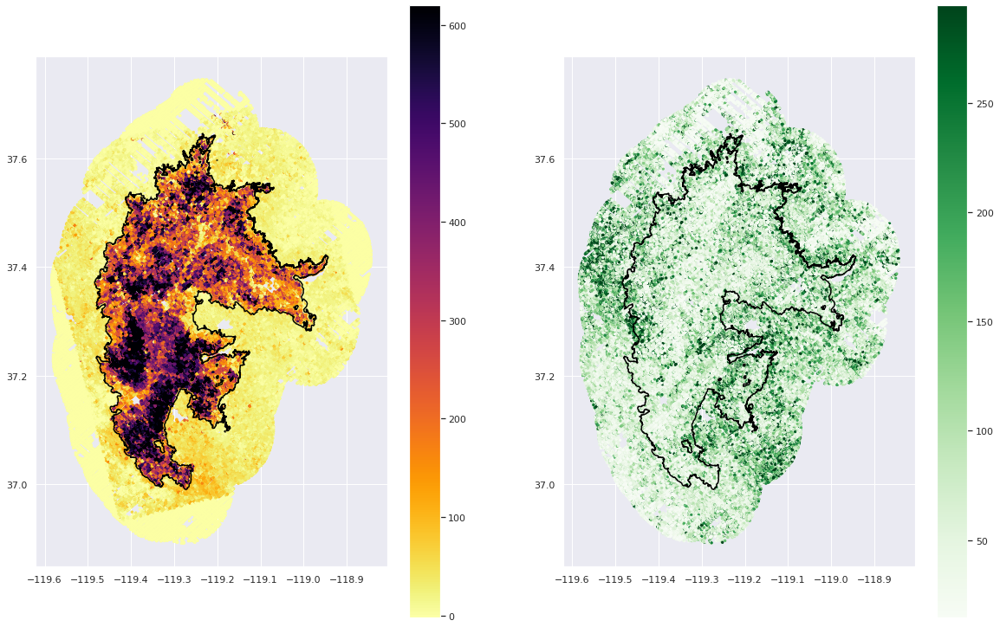

In [152]:
fig, ax = plt.subplots(1, 2, figsize=(20, 13))

geo_plot(gedi_all_dnbr, ax[0], 'severity_mean')
gedi_viz.geo_plot(gedi_all, ax[1], 'agbd', cmap='Greens')
creek.fire.boundary.plot(ax=ax[0], color='black')
creek.fire.boundary.plot(ax=ax[1], color='black')

<AxesSubplot: >

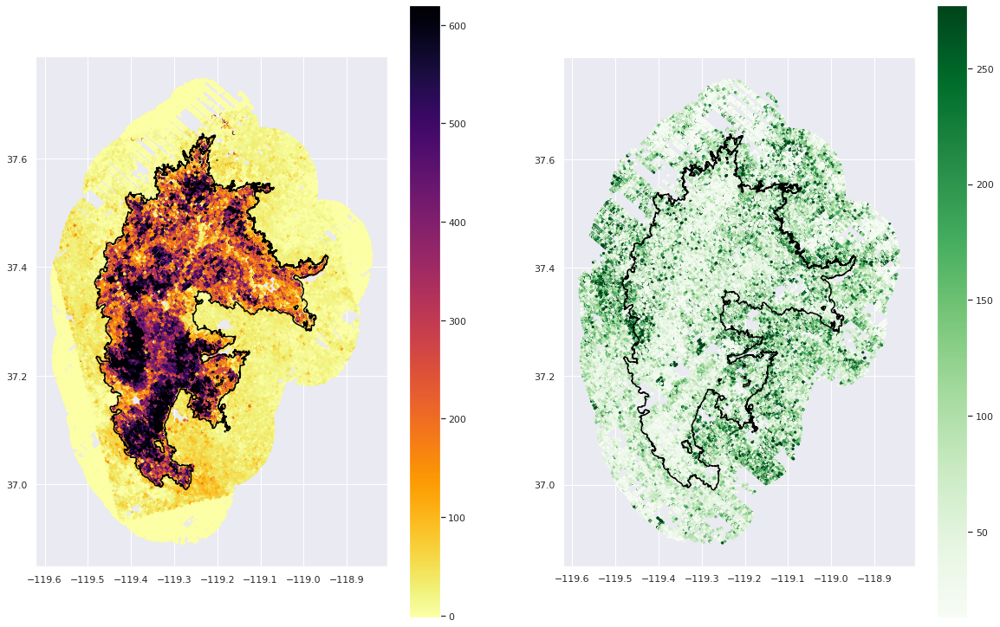

In [154]:
fig, ax = plt.subplots(1, 2, figsize=(20, 13))

geo_plot(gedi_all_dnbr, ax[0], 'severity_mean')
gedi_viz.geo_plot(after_fire(gedi_all), ax[1], 'agbd', cmap='Greens')
creek.fire.boundary.plot(ax=ax[0], color='black')
creek.fire.boundary.plot(ax=ax[1], color='black')

<AxesSubplot: >

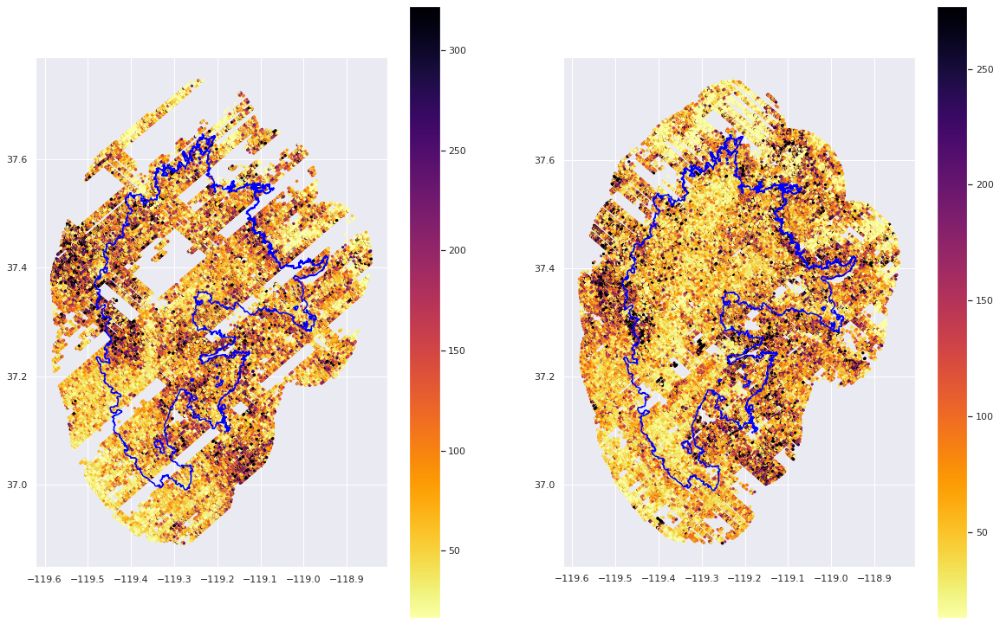

In [153]:
fig, ax = plt.subplots(1, 2, figsize=(20, 13))

geo_plot(before_fire(gedi_all), ax[0], 'agbd')
geo_plot(after_fire(gedi_all), ax[1], 'agbd')
creek.fire.boundary.plot(ax=ax[0], color='blue')
creek.fire.boundary.plot(ax=ax[1], color='blue')